# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying The breed of a dog given an image of a dog.

When I'm sitting and I take a photo of a dog, Y want to know what breed of dog it is.

## 2. Data
The data we are using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We are dealing with images (Unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are aroung 10,000+ images in training set (these images have labels).
* There are around 10,000+ images in test set (these images have no labels, because we'll want to predict them).


In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/Train/train.zip" -d "/content/drive/MyDrive/Dog Vision/Train/"

In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/Test/test.zip" -d "/content/drive/MyDrive/Dog Vision/Test/"

### Get our workspace ready

* Import TensorFlow 2.x 
* Import TensorFlow Hub
* Make sure we are using a GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.8.2


In [ ]:
# Import necessary tools
import tensorflow_hub as hub
print("TF Hub version: " , hub.__version__)

# Check for GPU availability
print("GPU", "available(Yes)" if tf.config.list_physical_devices("GPU") else "not available")

TF Hub version:  0.12.0
GPU available(Yes)


## Getting our data ready (turning it into Tensors).
With all machine learning models, our data has to be in numerical format. So that's what we will be doing first. Turning our images into Tensors (numerical representations.)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

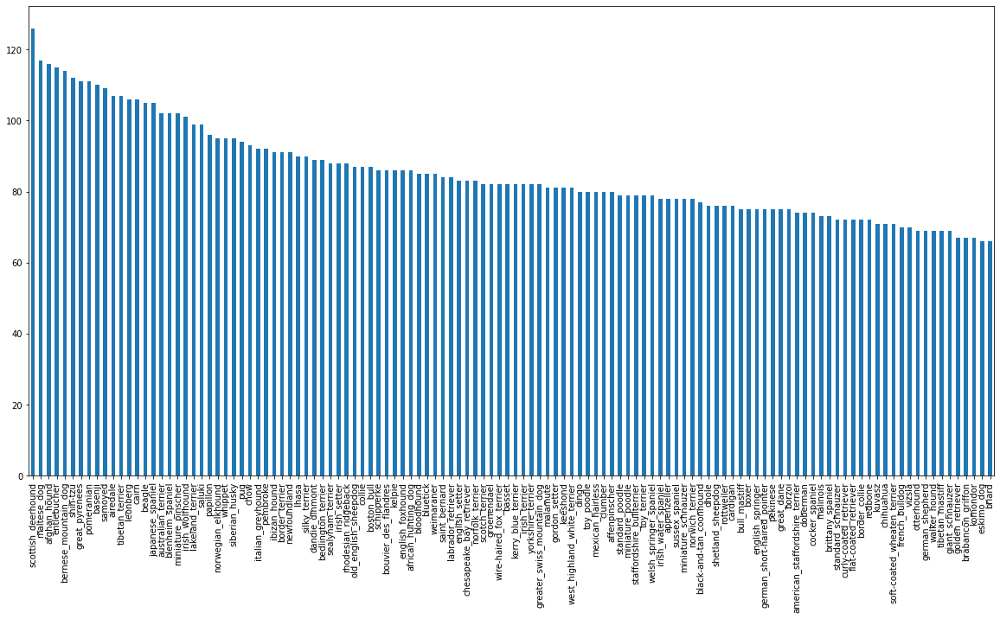

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

### Getting images and their labels

Let's get a list of our images file pathnames.

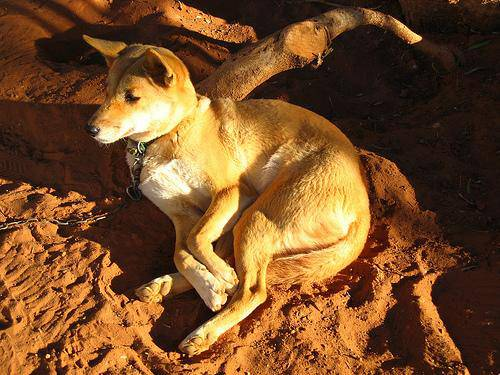

In [ ]:
# Let's view an image 
from IPython.display import Image
Image("drive/My Drive/Dog Vision/Train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image Id's
filenames = ["drive/My Drive/Dog Vision/Train/"+ fname + ".jpg" for fname in labels_csv["id"]]

#Check first 10 filenames
filenames[:10]

['drive/My Drive/Dog Vision/Train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/Train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/Train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/Train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/Train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/Train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/Train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/Train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/Train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/Train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/Train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files.")

Filenames match actual amount of files.


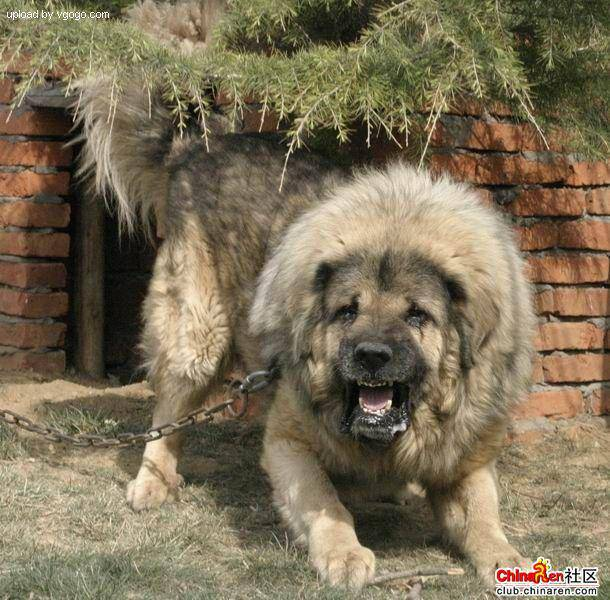

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
# labels = labels_csv["breed"].to_numpy()  Does the same thing.
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Does not match. Check data directory.")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_labels = np.unique(labels)
len(unique_labels)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_labels

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into an boolean array
boolean_labels = [label == unique_labels for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])  # Original label
print(np.where(unique_labels == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax())  # index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/Train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/Train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/Train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/Train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/Train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/Train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/Train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/Train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/Train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/Train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our whole validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
len(filenames)

10222

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimanting with ~ 1000 observations and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into train and valid of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 46)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:5]

(['drive/My Drive/Dog Vision/Train/07b46335006fbbe0328aeb8213b874ce.jpg',
  'drive/My Drive/Dog Vision/Train/0ec8020bc2c4bc1646a81737be8580e0.jpg',
  'drive/My Drive/Dog Vision/Train/0486732311e9d60e8712f1dc33c4ebe0.jpg',
  'drive/My Drive/Dog Vision/Train/14597c96d5c222eebd742f4207296314.jpg',
  'drive/My Drive/Dog Vision/Train/024ecfa590271db8616bfaa59159d7b2.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,  True, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape  # height, width, colour channel (RGB 0-255)

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_images(image_path, image_size = IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensors with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desire value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  # Return the image
  return image

## Turning data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 images (batch size) at a time (you can manually adjust batch size if needed).

In order to use TensorFlow effectively,  we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function that returns a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label)
  """
  image = process_images(image_path)
  return image, label

In [ ]:
(process_images(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples to Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels).
  """

  # It the data is a test dataset,we probably don't have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # only filepaths, no labels
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
                                          

  # Else its a training data
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # Shuffle pathnames and labels before mapping image processor function is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X))
    
    # Create (image, label) tuples (this also turns the image path into a preprocesses image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Creating traing and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little difficult to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

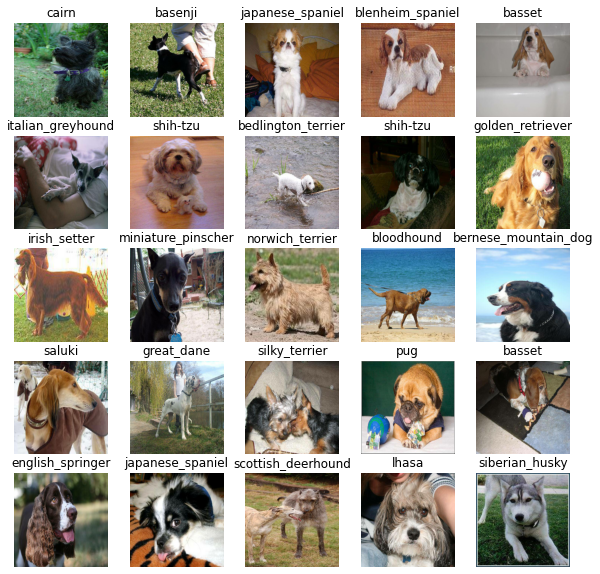

In [ ]:
# Now let's visualize the data in training batch
show_25_images(train_images, train_labels)

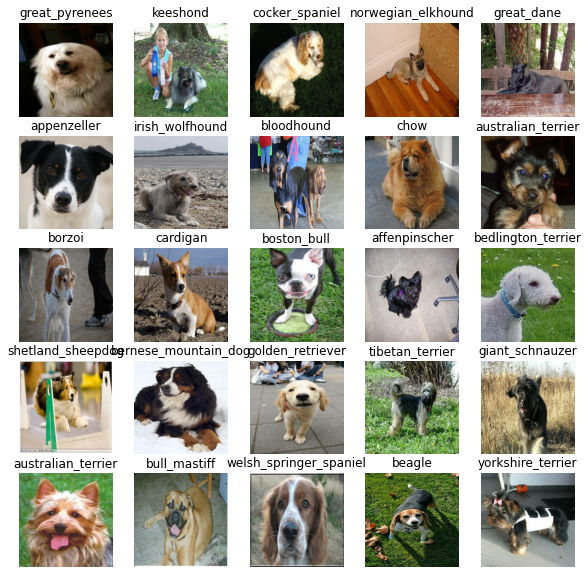

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors)
* The output shape (image labels, in the form of Tensors)
* The URL of the model we want to use from TensorFlow Hub. 
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5



In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
len(unique_labels)

120

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chose as parameters.
* Defines the layers in a Keras model in sequencial fashion (do this first, then this, then that).
* Compiles the model (says if should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All these steps can be found here:
https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Create callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving.

We'll create two collbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents from training for too long.

### TensorBoard Callback

To setupu a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training with %tensorboard magic function (we'll do this after model training). 

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():

  # Create a log directory to storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment)
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is onlly going to train on 1000 images, to makes sure everything is working.


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on ur model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model.

In [ ]:
 # Build a function to train and return a trained model.

 def train_model():
   """
   Trains a given model and returns the trained version.
   """

   # Create a model
   model = create_model()

   # Create new TensorBoard session everytime we train a model
   tensorboard = create_tensorboard_callback()

   # Fit the model to the data passing it the callbacks we created
   model.fit(x=train_data,
             epochs=NUM_EPOCHS,
             validation_data=val_data,
             validation_freq=1,
             callbacks=[tensorboard, early_stopping])
   
   # Return the fitted model
   return model

In [ ]:
# # Fit the model to the data
# model = train_model()

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neaural networks?

**Note:** Overfitting to begining with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs 

The TensorBoard magis function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 6s 858ms/step


array([[8.4692286e-03, 1.3300829e-02, 1.9797131e-03, ..., 1.1770226e-02,
        4.6439547e-04, 2.3619917e-03],
       [1.2715996e-03, 2.1160724e-02, 3.7395391e-03, ..., 2.4436265e-03,
        3.1240080e-02, 1.0013912e-02],
       [9.6202753e-03, 5.9276557e-04, 3.6081593e-03, ..., 1.8814427e-03,
        1.5298162e-03, 1.1107870e-02],
       ...,
       [7.0423965e-05, 9.7712153e-04, 1.7727163e-02, ..., 1.4224058e-03,
        5.8998336e-04, 4.8159368e-02],
       [1.9866545e-02, 2.2610929e-03, 8.3536711e-03, ..., 2.2519552e-03,
        4.6194223e-04, 2.7112901e-02],
       [1.9428397e-02, 1.7121028e-02, 9.6369004e-03, ..., 1.0099630e-03,
        1.3522365e-03, 2.0781984e-03]], dtype=float32)

In [ ]:
len(predictions[0])

120

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_labels)

120

In [ ]:
np.sum(predictions[1])

1.0000001

In [ ]:
# First prediction

index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")

[0.00846923 0.01330083 0.00197971 0.0060749  0.00689539 0.00409777
 0.02050931 0.00515246 0.0014567  0.000606   0.01197203 0.00048799
 0.00095685 0.00235073 0.00041213 0.00652228 0.00527253 0.00152229
 0.00017902 0.00242909 0.00924565 0.01930785 0.00257255 0.00151851
 0.00089424 0.01252022 0.00382848 0.00045686 0.00627416 0.00354014
 0.00211366 0.00631401 0.00074882 0.00326024 0.00309584 0.00165393
 0.00308119 0.00016714 0.00567199 0.0012674  0.0045499  0.01292675
 0.00124788 0.00036425 0.00133068 0.02702657 0.0086733  0.01653931
 0.00986527 0.00172899 0.00267376 0.00105428 0.00210963 0.00772246
 0.0045064  0.00153751 0.00372688 0.00268042 0.00659391 0.00193241
 0.04710276 0.00134212 0.00845727 0.02833152 0.0177279  0.00257043
 0.00482466 0.00184764 0.00820962 0.0061869  0.00808486 0.00337902
 0.01988525 0.15258938 0.0073472  0.00354923 0.05622492 0.01195985
 0.00316851 0.00828869 0.00728362 0.00414335 0.00185568 0.00726131
 0.00190114 0.0122705  0.00350078 0.00203904 0.00188795 0.0072

In [ ]:
 unique_labels[88]

'pug'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better to see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_labels[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'bedlington_terrier'

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.01820525, 0.02604839, 0.        ],
         [0.03461135, 0.04245448, 0.00177962],
         [0.08103258, 0.08887572, 0.03700247],
         ...,
         [0.10435918, 0.1354166 , 0.08534657],
         [0.09851189, 0.12917274, 0.08156515],
         [0.09266449, 0.12221631, 0.08149502]],
 
        [[0.01443187, 0.01849959, 0.        ],
         [0.02946429, 0.03643129, 0.00043846],
         [0.0649685 , 0.07281164, 0.02683371],
         ...,
         [0.09606541, 0.05858284, 0.03058935],
         [0.09367996, 0.05530461, 0.02998948],
         [0.09034222, 0.05196687, 0.02665174]],
 
        [[0.01071429, 0.01463586, 0.        ],
         [0.01905606, 0.02297763, 0.        ],
         [0.03238624, 0.04022938, 0.00617826],
         ...,
         [0.10196079, 0.02050063, 0.        ],
         [0.09835435, 0.0160014 , 0.        ],
         [0.09835435, 0.0160014 , 0.        ]],
 
        ...,
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.     

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.01820525, 0.02604839, 0.        ],
         [0.03461135, 0.04245448, 0.00177962],
         [0.08103258, 0.08887572, 0.03700247],
         ...,
         [0.10435918, 0.1354166 , 0.08534657],
         [0.09851189, 0.12917274, 0.08156515],
         [0.09266449, 0.12221631, 0.08149502]],
 
        [[0.01443187, 0.01849959, 0.        ],
         [0.02946429, 0.03643129, 0.00043846],
         [0.0649685 , 0.07281164, 0.02683371],
         ...,
         [0.09606541, 0.05858284, 0.03058935],
         [0.09367996, 0.05530461, 0.02998948],
         [0.09034222, 0.05196687, 0.02665174]],
 
        [[0.01071429, 0.01463586, 0.        ],
         [0.01905606, 0.02297763, 0.        ],
         [0.03238624, 0.04022938, 0.00617826],
         ...,
         [0.10196079, 0.02050063, 0.        ],
         [0.09835435, 0.0160014 , 0.        ],
         [0.09835435, 0.0160014 , 0.        ]],
 
        ...,
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.     

In [ ]:
get_pred_label(labels_[0])

'great_pyrenees'

In [ ]:
get_pred_label(predictions[0])

'maltese_dog'

Now we've got ways to get:
* Prediction labels
* Validation labels (Truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of an image and an integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, it's predicted probability, the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

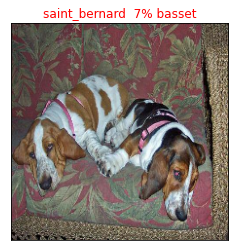

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=199)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of predictions probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

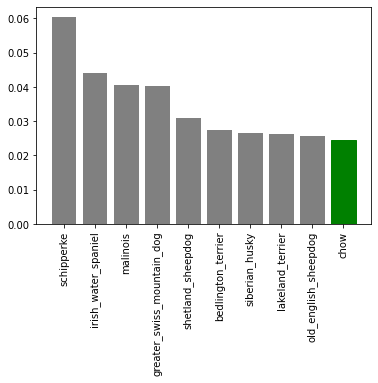

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=50)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out few.

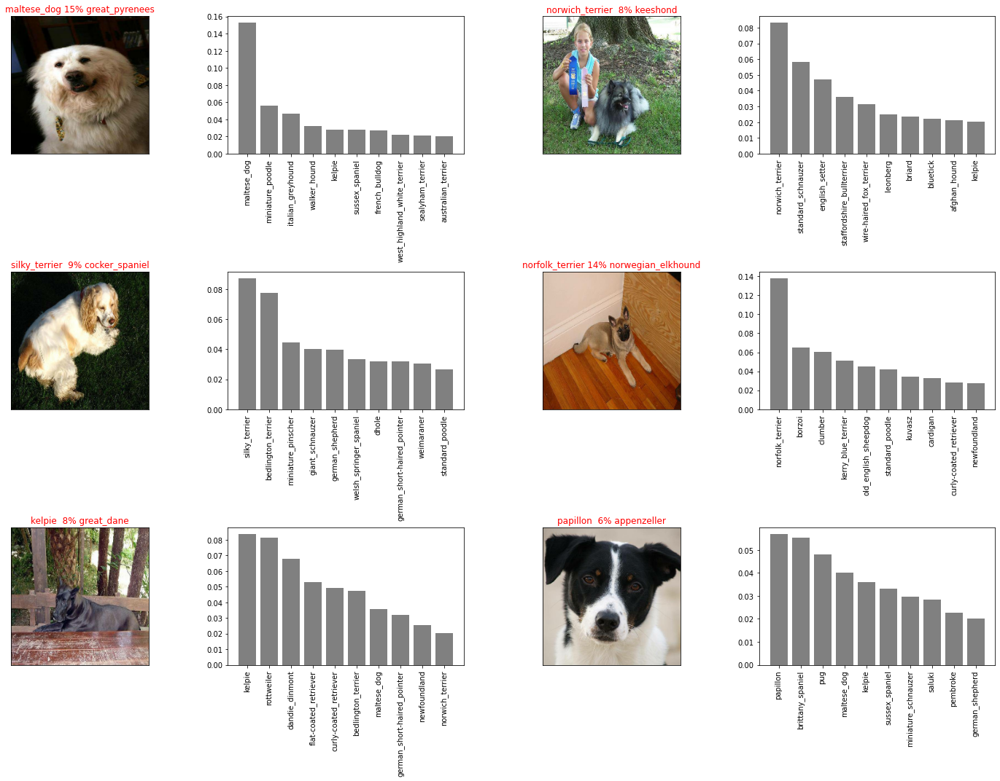

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

 ## Saving and reloading a trained model

In [ ]:
# Create a function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in model's directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"    # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!


In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20220830-05061661836016-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/Models/20220830-05061661836016-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/Models/20220829-04531661748824-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20220829-04531661748824-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 82ms/step - loss: 5.5255 - accuracy: 0.0050


[5.525495529174805, 0.004999999888241291]

In [ ]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.1889 - accuracy: 0.6550


[1.1888525485992432, 0.6549999713897705]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:5]

['drive/My Drive/Dog Vision/Train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/Train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/Train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/Train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/Train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can's monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


**Note:**  Running the cell below will take little while (maybe up tp 30 mins for the first epoch) because the GPU we're using in the runtime has to load all the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 115ms/step - loss: 1.3494 - accuracy: 0.6666
Epoch 2/100
320/320 [==============================] - 42s 130ms/step - loss: 0.4026 - accuracy: 0.8789
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2362 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1540 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1058 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0776 - accuracy: 0.9851
Epoch 7/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0584 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0457 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0371 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 40s 124m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20220830-05231661837016-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/Models/20220830-05231661837016-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
 # Load in the full model
 loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/Models/20220829-05431661751824-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20220829-05431661751824-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on the images in the form of Tensor batches,to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to ` True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/Test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/Test/e726ac27864ecbde1f5822c4d6e26c17.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e78b4a09e5f86c330e24c6aaed63f0be.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e7b357150635c250757363718e4dae86.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e7041fdc87517192097e62b3822309b7.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e7129bc2dbbba99bedc87c7787cbdf1f.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e715a411098c046cac90c3facfa58c77.jpg',
 '/content/drive/MyDrive/Dog Vision/Test/e96fd30110107e506de94d81af346238.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on full model and passing it the test data batch will take a long time to run (about an `1hr).

In [ ]:
# Make predictions on test data batch on loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 43s 125ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) to csv file (for access later)
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.92519525e-11, 3.78521986e-06, 3.43618289e-08, ...,
        9.90947708e-04, 7.02584479e-09, 6.97662328e-09],
       [5.22926427e-07, 1.31307631e-09, 3.13210862e-08, ...,
        1.16752917e-05, 2.79088042e-09, 5.48193824e-10],
       [8.68561983e-06, 4.87538843e-10, 7.28903027e-09, ...,
        3.69315757e-07, 7.41996402e-08, 1.22545989e-05],
       ...,
       [2.73771694e-09, 1.09341286e-10, 5.05672171e-09, ...,
        7.54633334e-08, 8.27000076e-06, 1.82745676e-08],
       [1.49728230e-09, 1.09742555e-10, 1.12034534e-10, ...,
        1.96598315e-09, 5.20235699e-06, 6.04768680e-10],
       [5.17414887e-12, 2.37473027e-11, 9.99992728e-01, ...,
        1.90957850e-09, 1.63849594e-11, 4.15226985e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kagle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFRame with an ID column as well as a colummn for each dog breed
* Add data to ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFRame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_labels))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e726ac27864ecbde1f5822c4d6e26c17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e78b4a09e5f86c330e24c6aaed63f0be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7b357150635c250757363718e4dae86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e76a7a1d23d687b5015b07df762c0c10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e702ddff98bd0b05ab200ffb43fb080a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_labels)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e726ac27864ecbde1f5822c4d6e26c17,1.925195e-11,3.785220e-06,3.436183e-08,8.898551e-05,1.485544e-06,2.972579e-07,7.801675e-11,8.095540e-09,4.511842e-09,...,1.356303e-09,2.570177e-12,4.296765e-06,4.816872e-07,4.912663e-05,1.108964e-10,1.523943e-10,9.909477e-04,7.025845e-09,6.976623e-09
1,e78b4a09e5f86c330e24c6aaed63f0be,5.229264e-07,1.313076e-09,3.132109e-08,7.428039e-09,8.915829e-04,7.187514e-06,2.925475e-10,4.648545e-06,8.012239e-09,...,1.763474e-08,7.380034e-10,6.614405e-08,2.365375e-07,3.041528e-08,2.445508e-08,4.027078e-07,1.167529e-05,2.790880e-09,5.481938e-10
2,e7b357150635c250757363718e4dae86,8.685620e-06,4.875388e-10,7.289030e-09,1.322542e-05,2.118547e-06,1.041944e-09,1.132551e-03,2.732562e-06,2.423169e-07,...,1.641688e-04,4.235180e-03,4.546432e-07,2.656201e-07,3.805840e-09,5.311801e-07,3.169378e-03,3.693158e-07,7.419964e-08,1.225460e-05
3,e76a7a1d23d687b5015b07df762c0c10,2.859606e-14,6.940709e-15,1.556899e-09,3.896267e-15,4.340032e-11,3.748164e-10,1.767562e-09,1.741658e-06,3.123266e-11,...,4.925363e-11,8.956077e-08,3.420726e-13,1.668591e-11,2.743388e-13,1.942741e-11,3.381039e-11,9.919876e-10,1.488295e-09,8.008441e-13
4,e702ddff98bd0b05ab200ffb43fb080a,5.149763e-05,2.272667e-06,9.483237e-08,5.279261e-09,2.294553e-09,5.398755e-10,4.718860e-09,1.322204e-07,5.960511e-09,...,4.950912e-06,1.201386e-08,8.674470e-11,1.081928e-10,1.156957e-10,1.391985e-09,4.775222e-07,1.014989e-08,8.394275e-06,8.258964e-06


In [ ]:
# Saveour predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_subission_2_mobilenetv2.csv",
                index=False)